# Noise Reduction procedure for Wasan Documents:
___________________________________________

# Data


In [1]:
# Integrate plots into notebook
#%matplotlib notebook
%matplotlib inline

# Necessary imports

In [40]:
import matplotlib.pyplot as plt

In [41]:
import cv2
import numpy as np
def read_grayscale(path):
    retVal = cv2.imread(path,cv2.IMREAD_GRAYSCALE)
    if retVal is None: raise Exception("Reading GRAYSCALE image, something went wrong with the file name "+str(path))
    return retVal

def enhanceBlackCharacters(im,size,it):
    kernel=np.ones((size,size),np.uint8)
    return cv2.erode(im,kernel,iterations = it)
    
def detectLines(grayOriginal, kWidth = 1, ratioLines = 50):
    """
        Function to extract vertical and horizontal lines 
        using morphological operators
    """
    gray = cv2.bitwise_not(grayOriginal)
    bw = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 15, -2)
    # Create the images that will use to extract the horizontal and vertical lines
    processingV = np.copy(bw)
    processingH = np.copy(bw)
    
    # Specify sizes 
    rows, columns = processingV.shape
    vSize = rows // ratioLines
    hSize = columns // ratioLines
    
    # structure elements for extracting vertical and horizontal lines through morphology operations
    vStruct = cv2.getStructuringElement(cv2.MORPH_RECT, (kWidth, vSize))
    hStruct = cv2.getStructuringElement(cv2.MORPH_RECT, (hSize, kWidth))

    # Apply morphology operations
    #vertical lines
    processingV = cv2.erode(processingV, vStruct)
    processingV = cv2.dilate(processingV, vStruct)
    #horizontal lines
    processingH = cv2.erode(processingH, hStruct)
    processingH = cv2.dilate(processingH, hStruct)
        
    # Inverse image
    processing = 255 - processingV
    processing[processingH == 255] = 0
    '''
    Extract edges and smooth image according to the logic
    1. extract edges
    2. dilate(edges)
    3. src.copyTo(smooth)
    4. blur smooth img
    5. smooth.copyTo(src, edges)
    '''
    # Step 1
    edges = cv2.adaptiveThreshold(processing, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 3, -2)
    # Step 2
    kernel = np.ones((35, 35), np.uint8)
    edges = cv2.dilate(edges, kernel)
    # Step 3
    #smooth = np.copy(vertical)
    # Step 4
    #smooth = cv2.blur(smooth, (2, 2))
    # Step 5
    #(rows, cols) = np.where(edges != 0)
    #vertical[rows, cols] = smooth[rows, cols]
    # Show final result
    retVal = 255 - gray
    retVal[edges== 255] = 255
    return retVal
    

libpng warning: iCCP: known incorrect sRGB profile


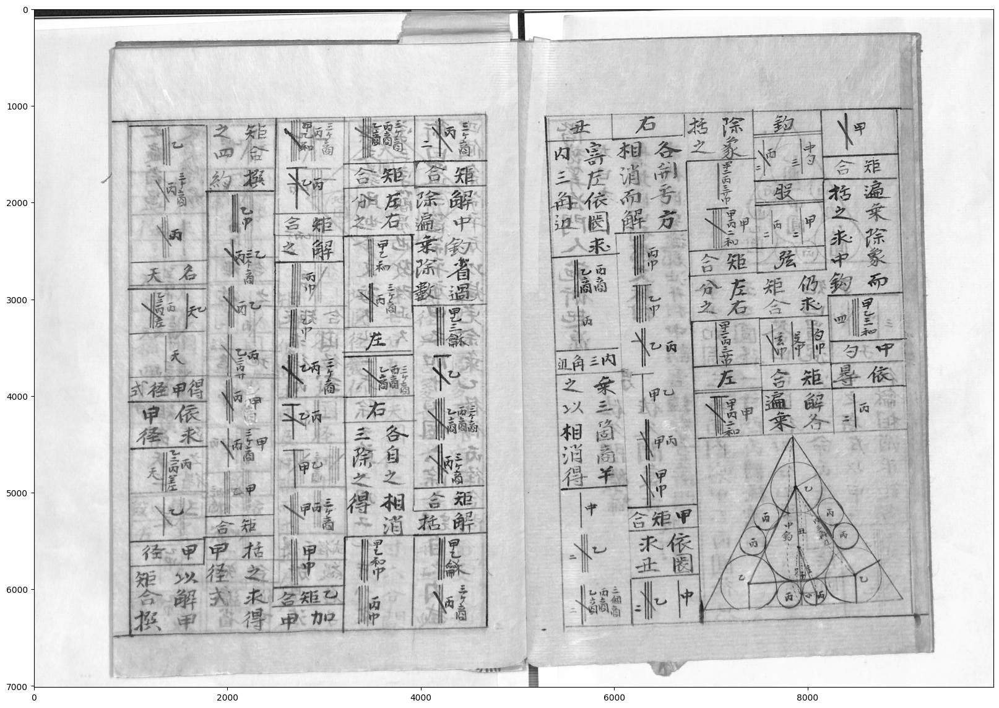

In [4]:
# read image of which we want to reduce noise
imagePath =  "./data/sakuma2(2024)/sakuma-0447_Page_03.png"
im = read_grayscale(imagePath)

# show image
plt.figure(figsize=(20,20))  
plt.imshow(im,cmap = "gray")
plt.show()

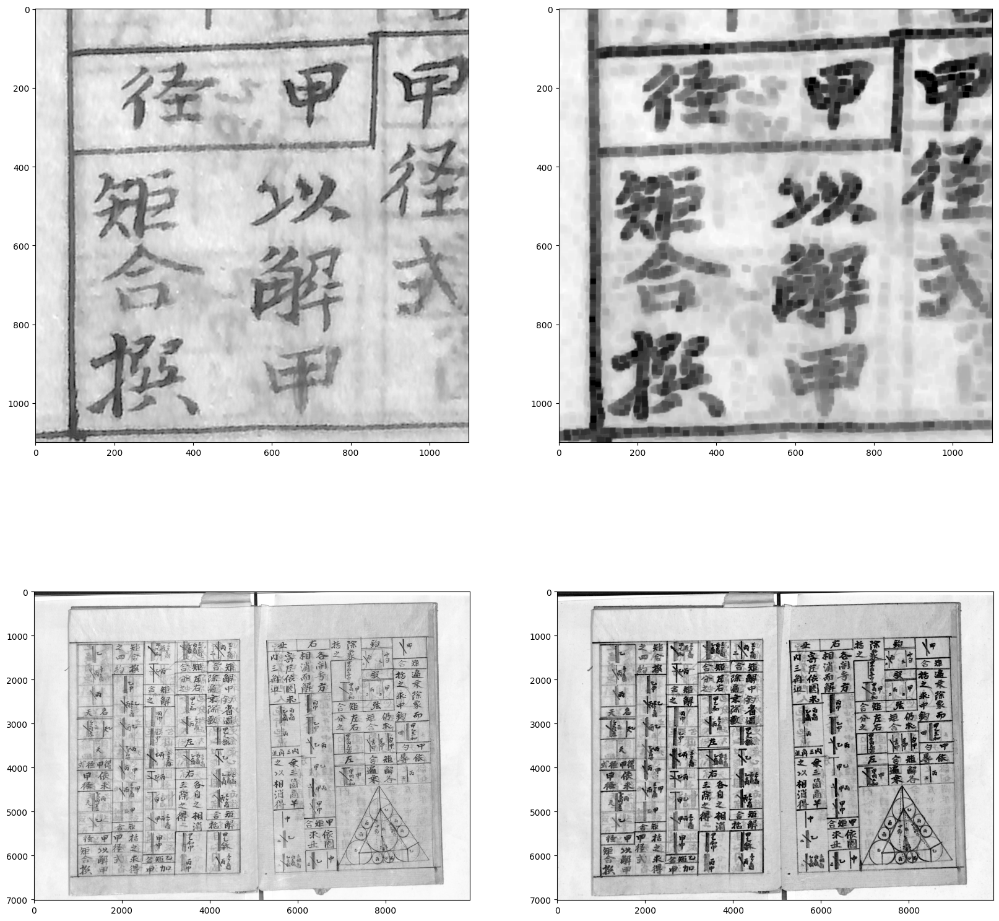

In [5]:
#reload(noiseRedPrep)
#import noiseRedPrep

# step one, bring up the kanji with erosion 
size = 5
its = 3
clearerKanji = enhanceBlackCharacters(im,size,its)

# Now plot the two images side by side
f, axarr = plt.subplots(2,2,figsize=(20,20))
axarr[0][0].imshow(im[5400:6500,900:2000],cmap='gray')
axarr[0][1].imshow(clearerKanji[5400:6500,900:2000],cmap='gray')
axarr[1][0].imshow(im,cmap='gray')
axarr[1][1].imshow(clearerKanji,cmap='gray')

plt.show()

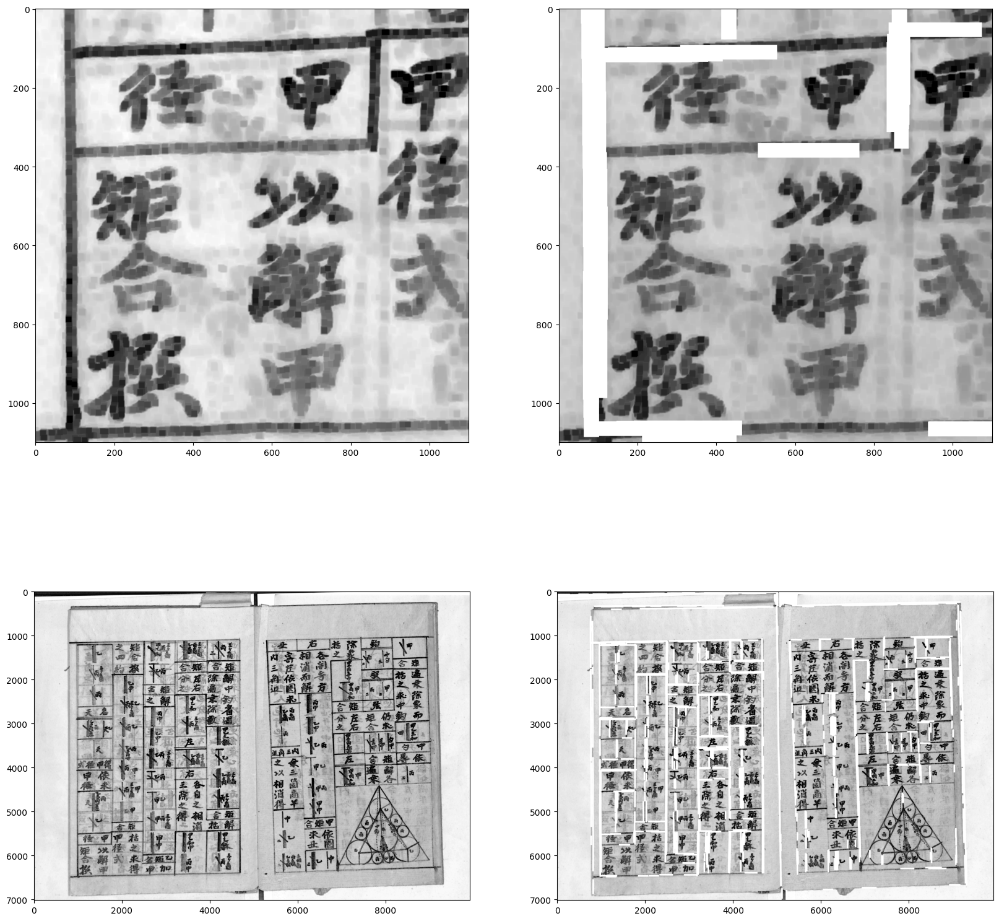

In [6]:
#step two function to erase linear structures
noLines = detectLines(clearerKanji)

# Now plot the two images side by side
f, axarr = plt.subplots(2,2,figsize=(20,20))
axarr[0][0].imshow(clearerKanji[5400:6500,900:2000],cmap='gray')
axarr[0][1].imshow(noLines[5400:6500,900:2000],cmap='gray')
axarr[1][0].imshow(clearerKanji,cmap='gray')
axarr[1][1].imshow(noLines,cmap='gray')

plt.show()

In [7]:
def maskImage(im,mask):
    """
        receives an Image and a masks (black info on white bck)
        return the pixels in the image that are 
        white in the mask
    """
    aux = im.copy()
    aux[mask==255] = 255 
    return aux

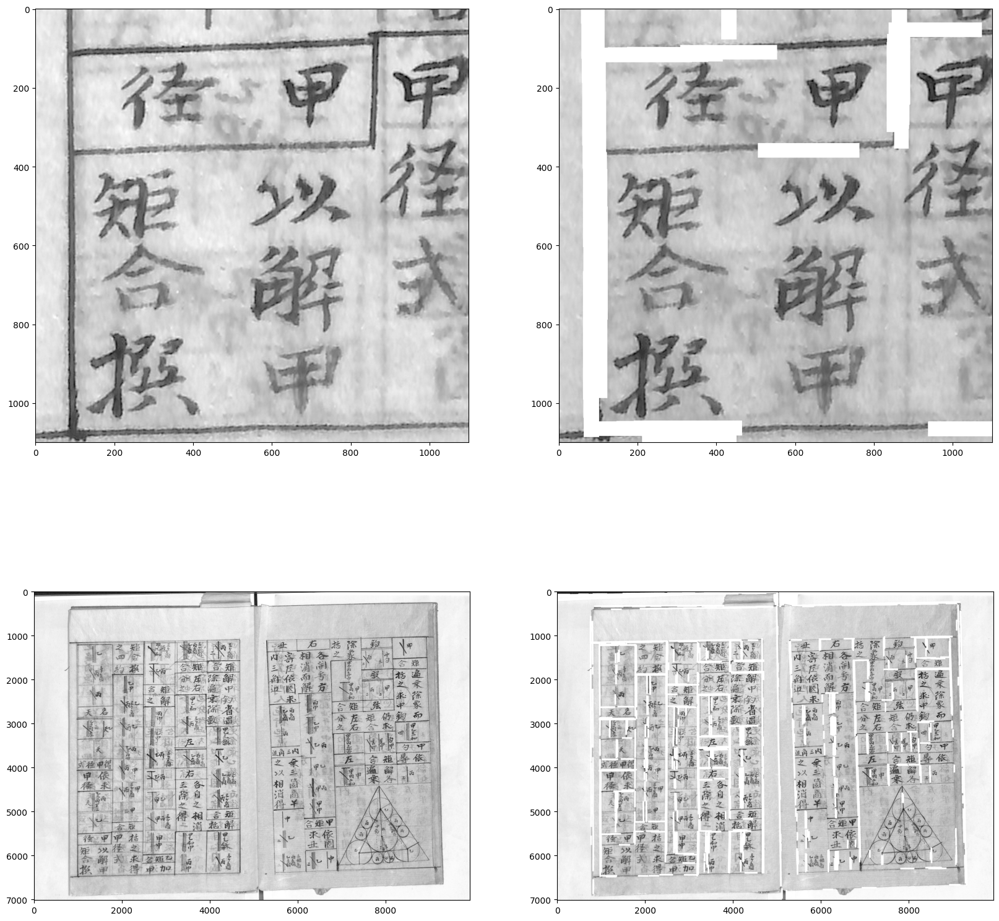

In [8]:
# step 3, mask original image with the line removed image
masked = maskImage(im,noLines)
# Now plot the two images side by side
f, axarr = plt.subplots(2,2,figsize=(20,20))
axarr[0][0].imshow(im[5400:6500,900:2000],cmap='gray')
axarr[0][1].imshow(masked[5400:6500,900:2000],cmap='gray')
axarr[1][0].imshow(im,cmap='gray')
axarr[1][1].imshow(masked,cmap='gray')

plt.show()

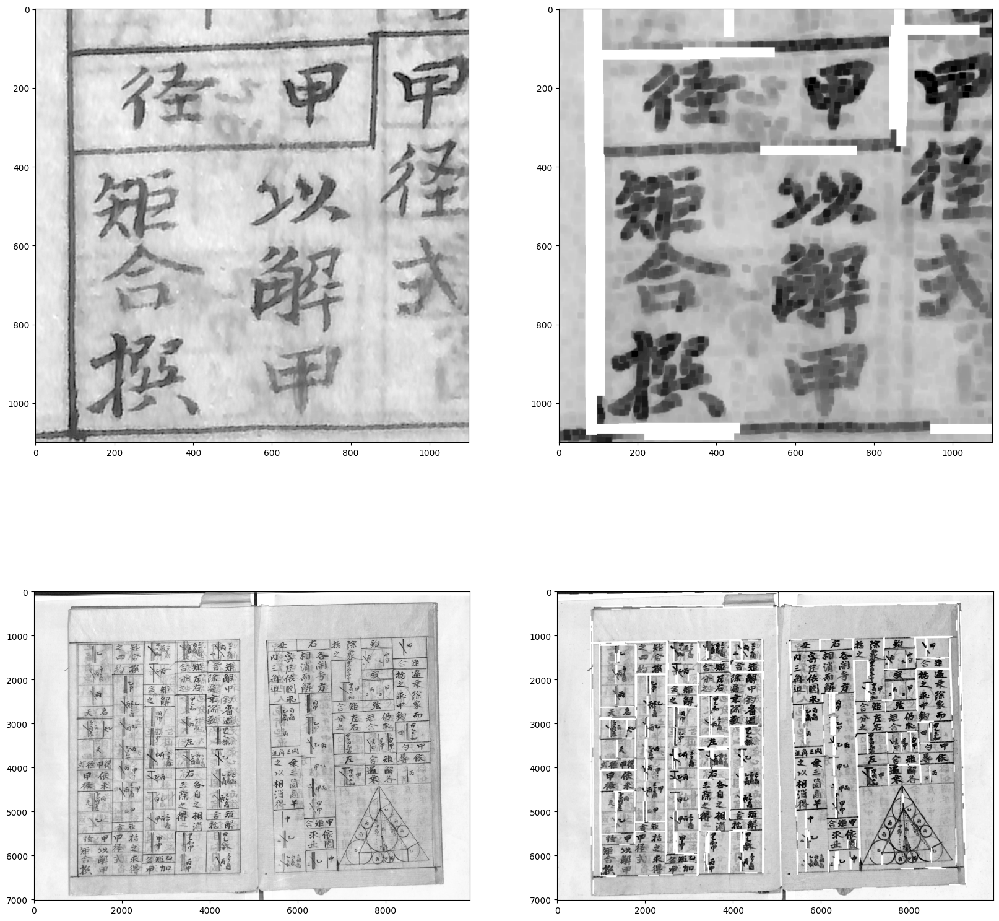

In [9]:
# step 4, bring up the kanji again with second erosion 
size = 5
its = 3

clearerKanji2 = enhanceBlackCharacters(masked,size,its)

# Now plot the two images side by side
f, axarr = plt.subplots(2,2,figsize=(20,20))
axarr[0][0].imshow(im[5400:6500,900:2000],cmap='gray')
axarr[0][1].imshow(clearerKanji2[5400:6500,900:2000],cmap='gray')
axarr[1][0].imshow(im,cmap='gray')
axarr[1][1].imshow(clearerKanji2,cmap='gray')

plt.show()

In [31]:
from skimage.filters import threshold_sauvola

def sauvolaThreshold(im,hardness = 1, window_size=25):
  """
  Function to apply Sauvola local threshold
  """
  th = threshold_sauvola(im, window_size=window_size)
  return (im > hardness*th).astype(int)*255

    
def cleanIsolatedPoints(img, it = 5):
    """
        to clean small isolated noise regions
        possible kernel
        np.ones((size1,size1),np.uint8)
    """
    kernel = np.ones((5, 5), np.uint8)
    first=cv2.erode(cv2.bitwise_not(img.astype('uint8') ),kernel,iterations = it)
    #return 250-first
    return cv2.bitwise_not(cv2.dilate(first,kernel,iterations = it))

def eraseSmall(maskI, areaTH = 250, its = 5, ws = 501):
    """
    Receive a binary image
    erase regions that are small than the threshold
    """
    # copy not to destroy input
    mask = maskI.copy()
    mask = sauvolaThreshold(mask,hardness = 1, window_size = ws)

    mask = cleanIsolatedPoints(mask, its)
    numLabels, labelIm, stats, centroids = cv2.connectedComponentsWithStats(255-mask)

    for j in range(1,len(np.unique(labelIm))):
        if stats[j][4] < areaTH :
            mask[labelIm == j] = 255
            #print("erasing "+str(j))
            #print(np.sum(labelIm==j))

    return mask

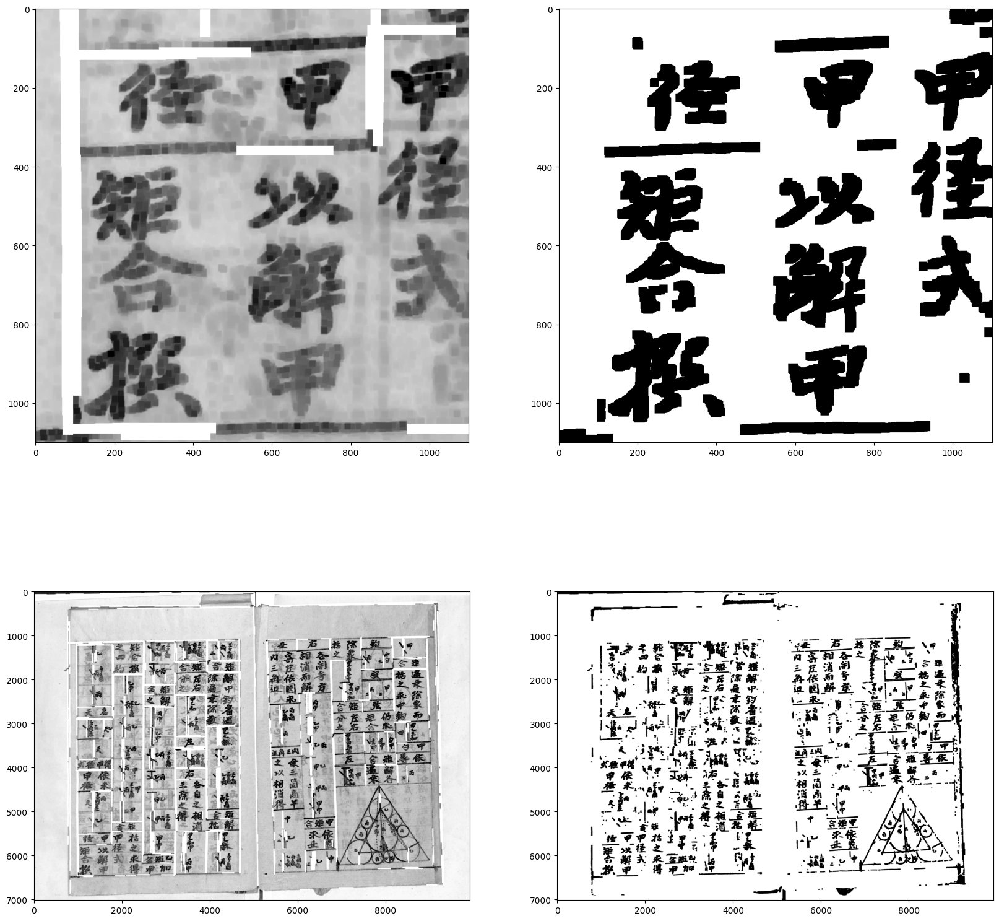

In [35]:
# Step 5, clean up small noise regions, includes binarization
smallRegionErased = eraseSmall(clearerKanji2, areaTH = 500, its = 5)

# Now plot the two images side by side
f, axarr = plt.subplots(2,2,figsize=(20,20))
axarr[0][0].imshow(clearerKanji2[5400:6500,900:2000],cmap='gray')
axarr[0][1].imshow(smallRegionErased[5400:6500,900:2000],cmap='gray')
axarr[1][0].imshow(clearerKanji2,cmap='gray')
axarr[1][1].imshow(smallRegionErased,cmap='gray')

plt.show()

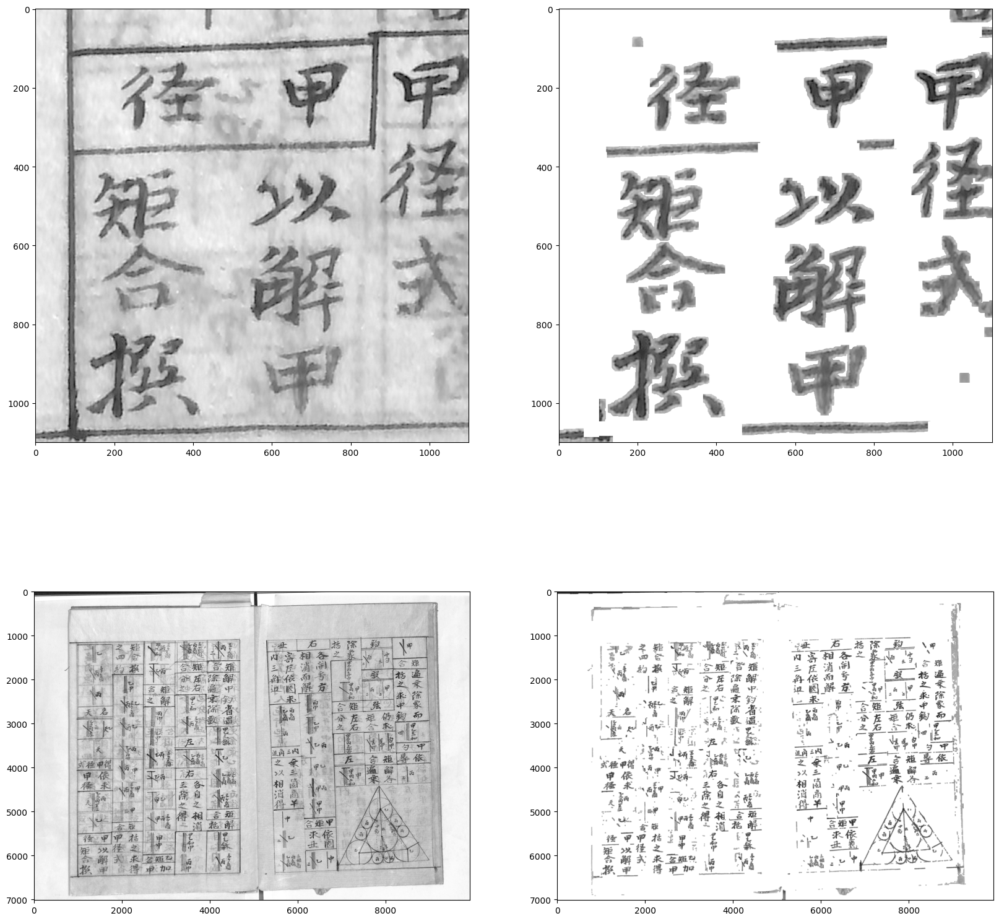

In [36]:
# step 6, mask again
masked2 = maskImage(masked, smallRegionErased)
# Now plot the two images side by side
f, axarr = plt.subplots(2,2,figsize=(20,20))
axarr[0][0].imshow(im[5400:6500,900:2000],cmap='gray')
axarr[0][1].imshow(masked2[5400:6500,900:2000],cmap='gray')
axarr[1][0].imshow(im,cmap='gray')
axarr[1][1].imshow(masked2,cmap='gray')
plt.show()


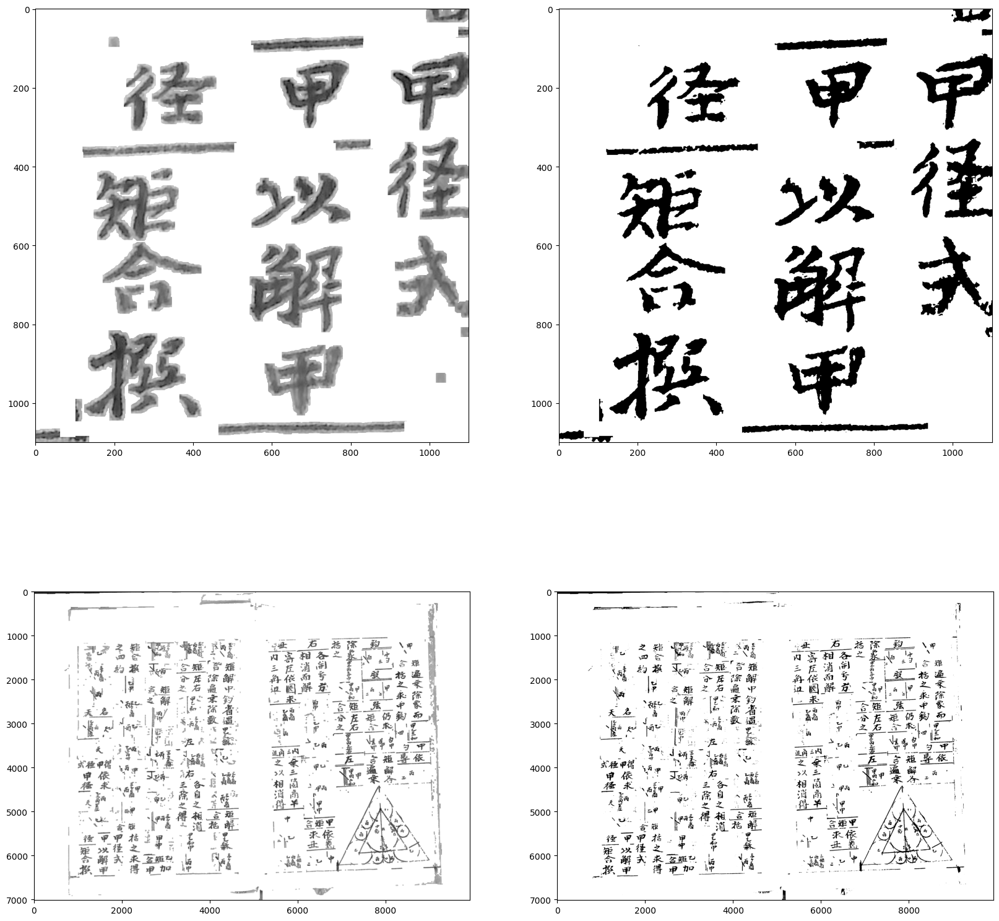

True

In [37]:
# step 7 HARD global thresholding to erase gray
final = masked2.copy()
th = 150
final[masked2<th] = 0 
final[masked2>=th] = 255 


# Now plot the two images side by side
f, axarr = plt.subplots(2,2,figsize=(20,20))
axarr[0][0].imshow(masked2[5400:6500,900:2000],cmap='gray')
axarr[0][1].imshow(final[5400:6500,900:2000],cmap='gray')
axarr[1][0].imshow(masked2,cmap='gray')
axarr[1][1].imshow(final,cmap='gray')

plt.show()


cv2.imwrite("final.png",final)


# Putting it all together, Noise reduction function

In [46]:
def reduceNoiseSakuma2(im, eroSize = 5, eroIts = 3, areaTH = 500, smallRIts=3, grayTH = 150):
    """
    Receives a grayscale image and reduces 
    noise according to the procedure described in
    https://www.mdpi.com/2076-3417/11/17/8050
    modified to include sauvola thresholding
    """
    # step 1, bring up the kanji with erosion 
    size = eroSize
    its = eroIts
    clearerKanji = enhanceBlackCharacters(im,size,its)
    #step 2, function to erase linear structures
    noLines = detectLines(clearerKanji, kWidth = 1, ratioLines = 50)
    # step 3, mask original image with the line removed image
    masked = maskImage(im,noLines)
    # step 4, bring up the kanji again with second erosion 
    clearerKanji2 = enhanceBlackCharacters(masked,size,its)
    # Step 5, clean up small noise regions, includes binarization
    smallRegionErased = eraseSmall(clearerKanji2, areaTH = areaTH, its = smallRIts)
    # step 6, mask again
    masked2 = maskImage(masked, smallRegionErased)
    # step 7 HARD global thresholding to erase gray
    final = masked2.copy()
    th = grayTH
    final[masked2<th] = 0 
    final[masked2>=th] = 255
    return final

libpng warning: iCCP: known incorrect sRGB profile


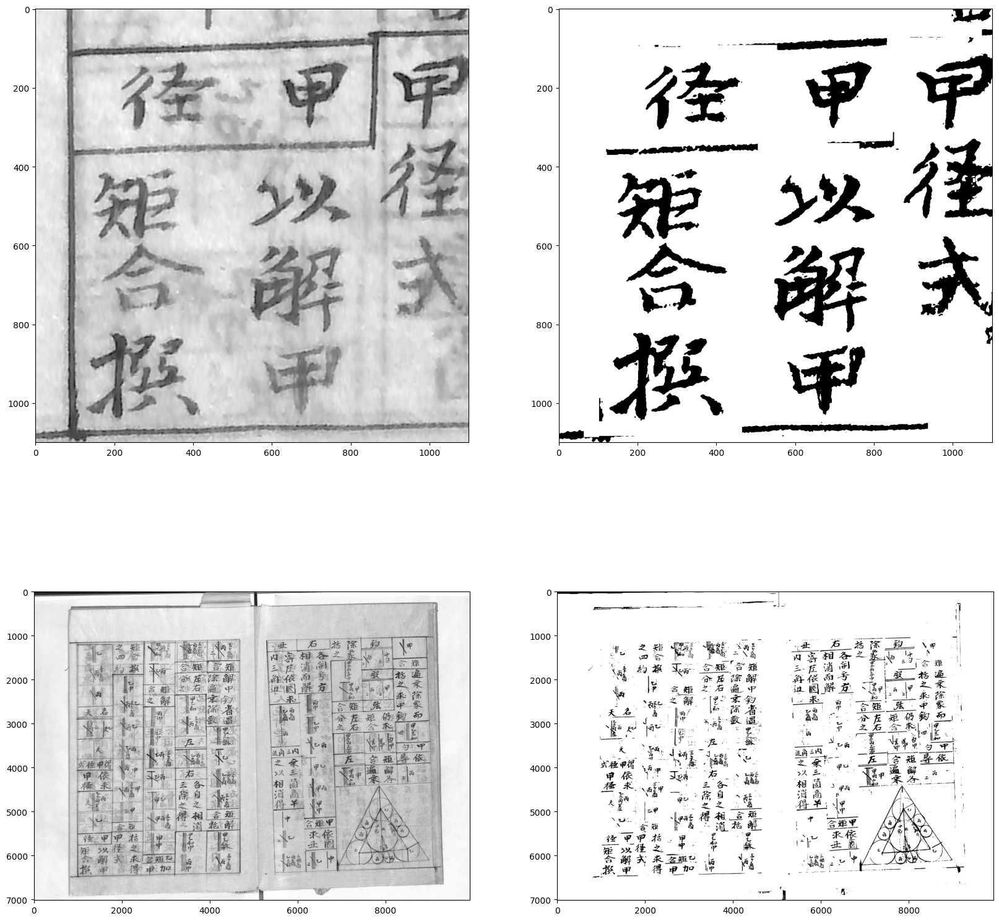

In [48]:
# read image of which we want to reduce noise
imagePath =  "./data/sakuma2(2024)/sakuma-0447_Page_03.png"
im = read_grayscale(imagePath)
result = reduceNoiseSakuma2(im)

# Now plot the two images side by side
f, axarr = plt.subplots(2,2,figsize=(20,20))
axarr[0][0].imshow(im[5400:6500,900:2000],cmap='gray')
axarr[0][1].imshow(result[5400:6500,900:2000],cmap='gray')
axarr[1][0].imshow(im,cmap='gray')
axarr[1][1].imshow(result,cmap='gray')

plt.show()
